In [1]:
import GPy, numpy as np
%matplotlib inline
from matplotlib import pyplot as plt
from IPython.display import HTML


In [2]:
np.random.seed(1234)
X = np.random.uniform(-2, 2, 500)[:,None]
X.sort(0)
k_1 = GPy.kern.Matern32(1, name='short')
k_2 = GPy.kern.Matern32(1, lengthscale=5, name='long')

K_1 = k_1.K(X)
K_2 = k_2.K(X)

y_1 = np.random.multivariate_normal(np.zeros(X.shape[0]), K_1, size=1).T
y_2 = np.random.multivariate_normal(np.zeros(X.shape[0]), K_2, size=1).T

y = y_1 + y_2 + np.random.normal(0, .1, y_1.shape)

In [3]:
from animate_gp import animate_kernel, plot_data, create_empty_ax, fill_grad

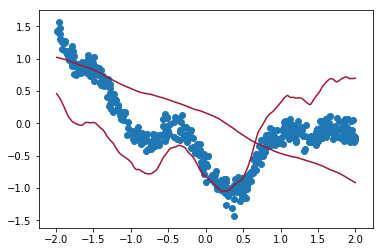

In [4]:
plt.plot(X, y_1, color='#9e1732')
plt.plot(X, y_2, color='#9e1732')
_ = plt.scatter(X, y)
# Make sure the function is driven by the linear trend, as there can be a difficulty in identifiability.

In [5]:
np.random.seed(1234)
choice = np.random.choice(X.shape[0]-50, 25, replace=False)+25
choice.sort(0)

_X = X[choice]
_Y = y[choice]

k = (
    k_1 
    + k_2
)
#k.randomize()
m = GPy.models.GPRegression(_X, _Y, k)
m.likelihood.variance = .1
m.optimize()

In [6]:
_mu, _K = m.predict_noiseless(X, full_cov=True)

fig, ax = create_empty_ax()
ax.set_xlim(X.min(), X.max())
fig.tight_layout()
fill_grad(ax, X, _mu, _K)
plot_data(ax, _X, _Y)
ax.plot(X, y_1 + y_2, color='#9e1732', lw=2)
anim = animate_kernel(fig, ax, X, _mu, _K, 'identify_short_long.mp4', frames=100)
plt.close(fig)
jshtml = anim.to_jshtml()
HTML(jshtml)

In [7]:
_mu, _K = m.predict_noiseless(X, full_cov=True, kern=m.kern.long.copy())

fig, ax = create_empty_ax()
ax.set_xlim(X.min(), X.max())
fig.tight_layout()
fill_grad(ax, X, _mu, _K)
#plot_data(ax, _X, _Y)
ax.plot(X, y_2, color='#9e1732', lw=2)
jsanim = animate_kernel(fig, ax, X, _mu, _K, 'identify_long.mp4', frames=100)
plt.close(fig)
jshtml = jsanim.to_jshtml()
HTML(jshtml)

In [8]:
_mu, _K = m.predict_noiseless(X, full_cov=True, kern=m.kern.short.copy())

fig, ax = create_empty_ax()
ax.set_xlim(X.min(), X.max())
fig.tight_layout()
fill_grad(ax, X, _mu, _K)
#plot_data(ax, _X, _Y)
ax.plot(X, y_1, color='#9e1732', lw=2)
jsanim = animate_kernel(fig, ax, X, _mu, _K, 'identify_short.mp4', frames=100)
plt.close(fig)
jshtml = jsanim.to_jshtml()
HTML(jshtml)

In [9]:
m

GP_regression.,value,constraints,priors
sum.short.variance,0.429045275464868,+ve,
sum.short.lengthscale,0.8484727772720237,+ve,
sum.long.variance,3.238517320356765e-09,+ve,
sum.long.lengthscale,3.045462091176223,+ve,
Gaussian_noise.variance,0.02037810504033711,+ve,
